In [1]:
#!pip install --upgrade pip

In [51]:
#!pip install librosa

In [52]:
#!pip install pydub

In [53]:
#!pip install ffmpeg

In [5]:
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio
from pydub import AudioSegment
import os
import pandas as pd
import tensorflow

/home/ec2-user/anaconda3/envs/amazonei_tensorflow2_p36/lib/python3.6/site-packages/pydub/utils.py:170: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)


In [6]:
normal = '/home/ec2-user/SageMaker/ACM/audio normal/'
contaminado = '/home/ec2-user/SageMaker/ACM/audio contaminado/'

In [7]:
# funcion para obtener el nombre de los archivos de audio
def contenido_audios():
    a = os.listdir(normal)
    b = os.listdir(contaminado)
    return a,b

In [8]:
c1,c2 = contenido_audios()

In [9]:
# Funcion para obtener la metadata de los audios
# contenido: nombre de los audios, tipo_audio: la etiqueta a la que pertenece
def metadatos(contenido,tipo_audio):
    df = pd.DataFrame()
    df['file name'] = None
    df['Channels'] = None
    df['Sample width'] = None
    df['Frame rate (sample rate)'] = None
    df['Frame width'] = None
    df['Length (seg)'] = None
    df['Frame count'] = None
    df['Intensity'] = None
    for i in range(len(contenido)):
        audio_segment = AudioSegment.from_file(tipo_audio+str(contenido[i]))
        df.loc[i] = [contenido[i],audio_segment.channels,audio_segment.sample_width,audio_segment.frame_rate,
                        audio_segment.frame_width,len(audio_segment)/1000,audio_segment.frame_count(),
                        audio_segment.dBFS]

    return df

In [10]:
metadatos_audio_normal = metadatos(c1,normal)
metadatos_audio_normal = metadatos_audio_normal.assign(etiqueta='normal')

In [11]:
metadatos_audio_normal.head()

,file name,Channels,Sample width,Frame rate (sample rate),Frame width,Length (seg),Frame count,Intensity,etiqueta
0,20210724_1940_86_14.wav,2,2,44100,4,50.0,2205000.0,-42.632691,normal
1,20210724_0130_97_14.wav,2,2,44100,4,50.0,2205000.0,-44.872167,normal
2,20210723_1930_91_14.wav,2,2,44100,4,50.0,2205000.0,-43.660230,normal
3,20210726_0130_97_13.wav,2,2,44100,4,50.0,2205000.0,-42.246588,normal
4,20210725_2220_92_13.wav,2,2,44100,4,50.0,2205000.0,-42.246588,normal


In [12]:
print('Duracion media:',metadatos_audio_normal['Length (seg)'].mean())
print('Duracion maxima:',metadatos_audio_normal['Length (seg)'].max())
print('Duracion minima:',metadatos_audio_normal['Length (seg)'].min())

Duracion media: 50.1
Duracion maxima: 60.0
Duracion minima: 50.0


In [13]:
metadatos_audio_contaminado = metadatos(c2,contaminado)
metadatos_audio_contaminado = metadatos_audio_contaminado.assign(etiqueta='contaminado')

In [14]:
metadatos_audio_contaminado.head()

,file name,Channels,Sample width,Frame rate (sample rate),Frame width,Length (seg),Frame count,Intensity,etiqueta
0,Audios_T319S_20210509_0130_96_15.wav,2,2,44100,4,60.0,2646000.0,-26.666414,contaminado
1,Audios_T319T_20201205_1530_85_18.wav,2,2,44100,4,60.0,2646000.0,-15.826760,contaminado
2,Audios_T319T_20201204_0241_94_16.wav,2,2,44100,4,60.0,2646000.0,-34.731509,contaminado
3,Audios_T319R_20210527_0330_95_16.wav,2,2,44100,4,60.0,2646000.0,-37.823357,contaminado
4,Audios_T319T_20201126_0156_93_15.wav,2,2,44100,4,30.0,1323000.0,-37.341798,contaminado


In [15]:
print('Duracion media:',metadatos_audio_contaminado['Length (seg)'].mean())
print('Duracion maxima:',metadatos_audio_contaminado['Length (seg)'].max())
print('Duracion minima:',metadatos_audio_contaminado['Length (seg)'].min())

Duracion media: 59.08163265306123
Duracion maxima: 60.0
Duracion minima: 30.0


In [16]:
metadatos = pd.concat([metadatos_audio_normal, metadatos_audio_contaminado], axis=0, ignore_index=True)

In [17]:
N_FFT = 1024
HOP_LENGTH = 512 
WINDOW = 'hann'
SR = 44100
def feature(contenido,tipo_audio):
    df = pd.DataFrame()
    df['file name'] = None
    df['y'] = None
    df['stft'] = None
    df['Espectrograma'] = None
    df['Espectrograma scaled'] = None
    for i in range(len(contenido)):
        y, sr = librosa.load(tipo_audio+str(contenido[i]),sr=SR,mono=True)
        stft = librosa.stft(y,n_fft=N_FFT,hop_length=HOP_LENGTH,window=WINDOW)
        espectrograma = np.abs(stft)**2
        espectrograma_scaled = np.mean(espectrograma.T,axis=0)
        df.loc[i] = [contenido[i],y,stft,espectrograma,espectrograma_scaled]
    return df

In [18]:
# Funcion para escuchar un archivo de audio
def escuchar_audio(y,sr):
    audio = Audio(data=y, rate=sr)
    return audio

In [19]:
# Funcion para graficar la forma de onda (waveform) de un archivo de audio
def plot_waveform(y,sr):
    plt.figure(figsize = (15, 10))
    librosa.display.waveshow(y=y, sr=sr)
    plt.xlabel('Tiempo', fontsize = 15)
    plt.ylabel('Amplitud', fontsize = 15)
    plt.show()

In [20]:
# Funcion para graficar el espectrograma (spectrogram) de un archivo de audio
def plot_spectrogram(spectrogram,hop_length,sr):
    plt.figure(figsize = (15, 10))
    D = librosa.power_to_db(spectrogram)
    librosa.display.specshow(D,sr=sr,hop_length=hop_length,y_axis='log',x_axis='time')
    plt.colorbar(format='%+2.f')
    plt.show()

In [21]:
df_audio_normal = feature(c1,normal)
df_audio_normal = df_audio_normal.assign(etiqueta=0)

In [57]:
df_audio_normal.head()

,file name,y,stft,Espectrograma,Espectrograma scaled,etiqueta
0,20210724_1940_86_14.wav,"[0.0, 0.00881958, 0.0087890625, 0.008972168, 0...","[[(1.9832913+0j), (3.7366586+0j), (3.7520678+0...","[[3.9334443, 13.962617, 14.078012, 14.703899, ...","[14.121362, 3.591318, 0.047057174, 0.002485010...",0
1,20210724_0130_97_14.wav,"[0.005584717, 0.0054626465, 0.005432129, 0.005...","[[(1.2702329+0j), (2.9846907+0j), (2.8416104+0...","[[1.6134917, 8.908379, 8.07475, 7.808333, 8.89...","[8.413105, 2.1555746, 0.040376615, 0.001150080...",0
2,20210723_1930_91_14.wav,"[0.0059509277, 0.006072998, 0.006164551, 0.006...","[[(1.772426+0j), (3.3001258+0j), (3.4496849+0j...","[[3.141494, 10.890831, 11.900326, 10.890491, 1...","[11.207289, 2.8445334, 0.032993555, 0.00103517...",0
3,20210726_0130_97_13.wav,"[0.0, 0.008331299, 0.008392334, 0.008239746, 0...","[[(1.8611821+0j), (3.9869153+0j), (3.7724786+0...","[[3.4639988, 15.895494, 14.231595, 15.765328, ...","[15.498339, 3.9694185, 0.07358212, 0.002166512...",0
4,20210725_2220_92_13.wav,"[0.008575439, 0.008636475, 0.008483887, 0.0082...","[[(1.8891563+0j), (3.9858718+0j), (3.7814803+0...","[[3.5689118, 15.887174, 14.299593, 15.877475, ...","[15.404253, 3.9399645, 0.0688539, 0.0020899728...",0


In [22]:
df_audio_contaminado = feature(c2,contaminado)
df_audio_contaminado = df_audio_contaminado.assign(etiqueta=1)

In [23]:
df_audios = pd.concat([df_audio_normal, df_audio_contaminado], axis=0,ignore_index=True)

In [24]:
escuchar_audio(df_audios['y'][20],SR)

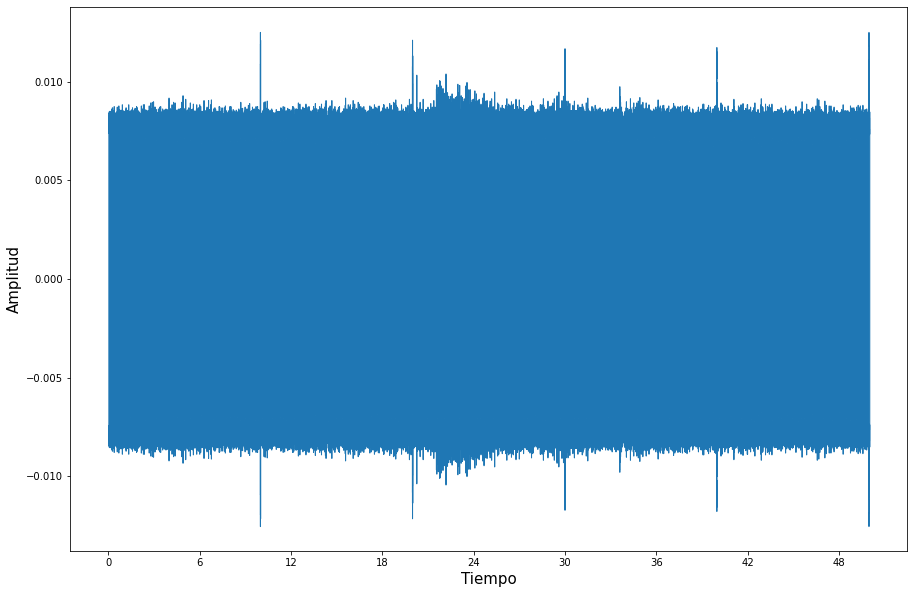

In [25]:
plot_waveform(df_audios['y'][20],SR)

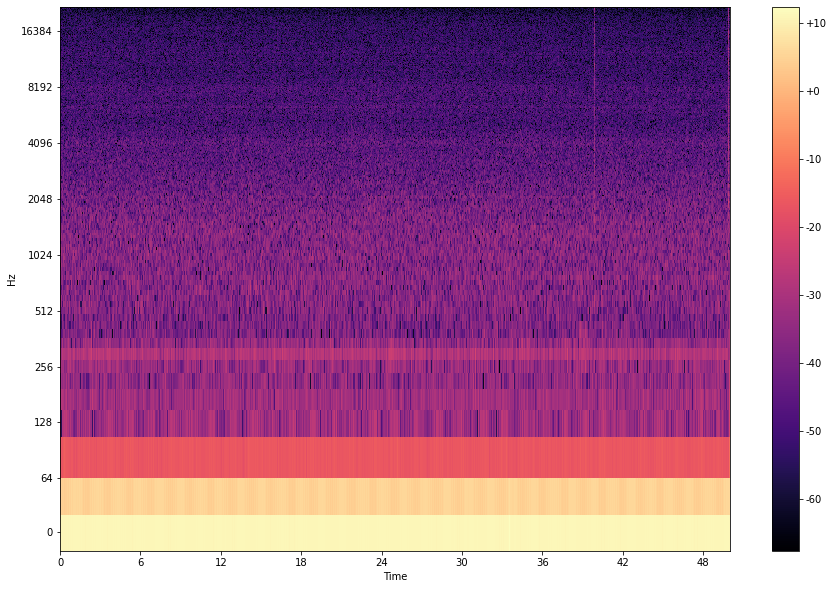

In [26]:
plot_spectrogram(df_audios['Espectrograma'][20],HOP_LENGTH,SR)

In [27]:
escuchar_audio(df_audios['y'][120],SR)

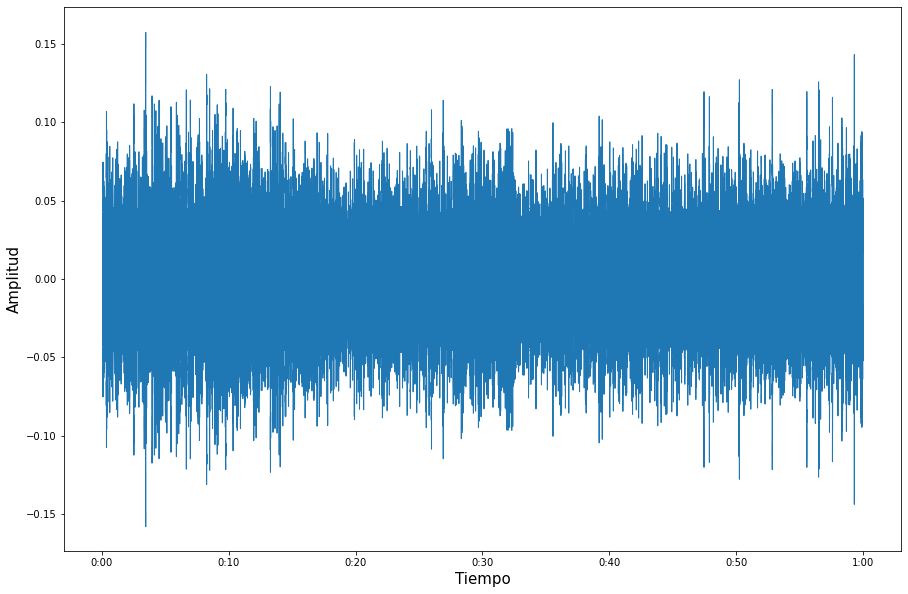

In [58]:
plot_waveform(df_audios['y'][150],SR)

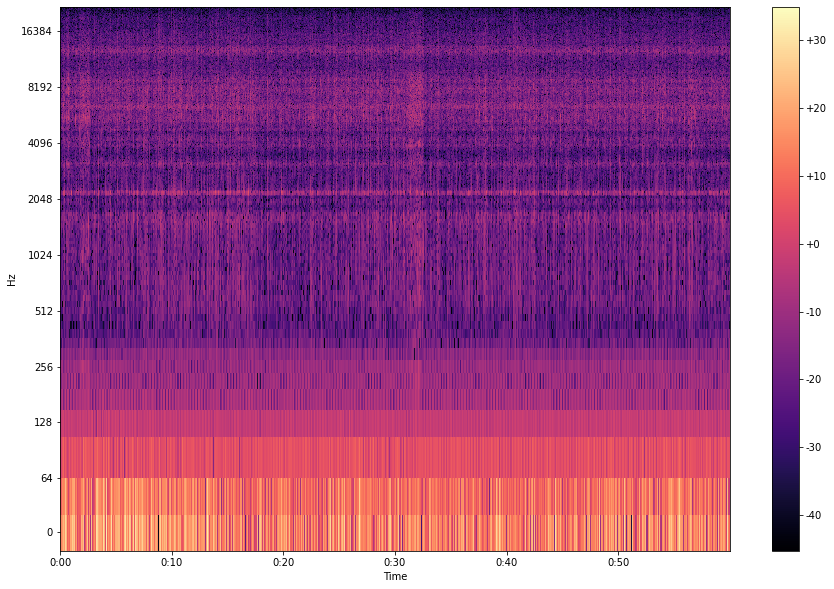

In [59]:
plot_spectrogram(df_audios['Espectrograma'][150],HOP_LENGTH,SR)

In [54]:
df_audios['Espectrograma'][120].shape

(513, 5168)

In [55]:
df_audios['Espectrograma'][20].shape

(513, 4307)

In [30]:
#df_modelo = df_audios.sample(frac=1,random_state=12,ignore_index=True)

In [31]:
X=np.array(df_audios['Espectrograma scaled'].tolist())
y=np.array(df_audios['etiqueta'].tolist())

In [32]:
print(X.shape)
print(y.shape)

(198, 513)
(198,)


In [33]:
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.25,random_state=1,stratify=y)

In [34]:
print(X_train.shape)
print(y_train.shape)

(148, 513)
(148,)


In [35]:
print(X_test.shape)
print(y_test.shape)

(50, 513)
(50,)


In [36]:
'''Dimensión del espacio de entrada:'''
input_size = X_train.shape[1]
input_size

513

In [37]:
num_labels = len(np.unique(y_train))
num_labels

2

In [38]:
from tensorflow.keras.utils import to_categorical

y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

In [39]:
'''Hiperparámetros de la red:'''
batch_size = 25
hidden_units = 16
dropout = 0.3
epochs = 50

In [40]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout

model = Sequential()
model.add(Dense(hidden_units, input_dim= input_size)) 
model.add(Activation('relu')) 
model.add(Dropout(dropout)) 
model.add(Dense(num_labels))
model.add(Activation('softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 16)                8224      
_________________________________________________________________
activation (Activation)      (None, 16)                0         
_________________________________________________________________
dropout (Dropout)            (None, 16)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 2)                 34        
_________________________________________________________________
activation_1 (Activation)    (None, 2)                 0         
Total params: 8,258
Trainable params: 8,258
Non-trainable params: 0
_________________________________________________________________


In [41]:
from keras import optimizers

'''Configuración'''
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

In [42]:
'''Entrenamiento del modelo'''
history = model.fit(X_train, y_train, batch_size= batch_size, epochs= epochs, validation_data= (X_test, y_test))

Epoch 1/50
6/6 [==============================] - 0s 50ms/step - loss: 2.0708 - accuracy: 0.4730 - val_loss: 0.7445 - val_accuracy: 0.5200
Epoch 2/50
6/6 [==============================] - 0s 10ms/step - loss: 1.5591 - accuracy: 0.4595 - val_loss: 0.7381 - val_accuracy: 0.5200
Epoch 3/50
6/6 [==============================] - 0s 5ms/step - loss: 1.4984 - accuracy: 0.5338 - val_loss: 0.7352 - val_accuracy: 0.5200
Epoch 4/50
6/6 [==============================] - 0s 7ms/step - loss: 1.4143 - accuracy: 0.5000 - val_loss: 0.7277 - val_accuracy: 0.5200
Epoch 5/50
6/6 [==============================] - 0s 5ms/step - loss: 1.7865 - accuracy: 0.4797 - val_loss: 0.7210 - val_accuracy: 0.5200
Epoch 6/50
6/6 [==============================] - 0s 8ms/step - loss: 1.2688 - accuracy: 0.5270 - val_loss: 0.7177 - val_accuracy: 0.5200
Epoch 7/50
6/6 [==============================] - 0s 6ms/step - loss: 1.2601 - accuracy: 0.5338 - val_loss: 0.7179 - val_accuracy: 0.5200
Epoch 8/50
6/6 [================

In [43]:
'''Evaluación en el conjunto de testeo'''
loss, acc = model.evaluate(X_test, y_test, batch_size=batch_size)
print("\nTest accuracy: %.1f%%" % (100.0 * acc))

2/2 [==============================] - 0s 1ms/step - loss: 0.4722 - accuracy: 0.9800

Test accuracy: 98.0%


In [44]:
predictions = model.predict(X_test)

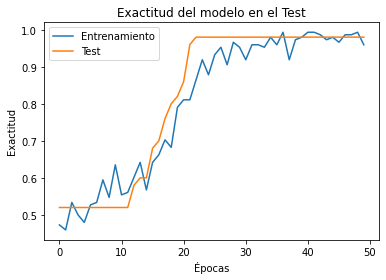

In [45]:
import matplotlib.pyplot as plt

'''Graficamos el desempeño en el conjunto de entrenamiento y testeo:'''
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Exactitud del modelo en el Test')
plt.ylabel('Exactitud')
plt.xlabel('Épocas')
plt.legend(['Entrenamiento', 'Test'], loc='upper left')
plt.show()

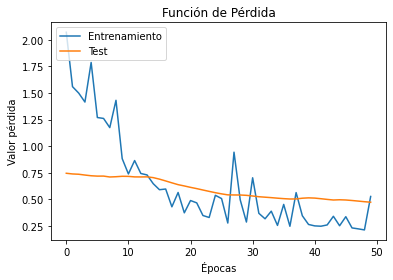

In [46]:
'''Graficamos el comportamiento de la función de pérdida:'''
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Función de Pérdida')
plt.ylabel('Valor pérdida')
plt.xlabel('Épocas')
plt.legend(['Entrenamiento', 'Test'], loc='upper left')
plt.show()

In [47]:
y_pred = (predictions > 0.5).astype("int32")
y_pred = np.argmax(y_pred, axis= 1)
y_pred

array([0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1,
       0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0,
       0, 1, 0, 0, 1, 1])

In [48]:
y_test = np.argmax(y_test, axis= 1)
y_test

array([0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1,
       0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0,
       0, 1, 0, 0, 1, 1])

In [49]:
from sklearn.metrics import confusion_matrix

matrix = confusion_matrix(y_test, y_pred)
print("Matriz de Confusion")
print(matrix)

Matriz de Confusion
[[24  1]
 [ 0 25]]
